<a href="https://colab.research.google.com/github/mqc25/Cell_count/blob/master/Patch_Grading.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

  Purpose: This code will read in a selection of cell slide images and generate patches that are likely to include the highest density of cells and/or easily distinguished cells.

In [0]:
'''
Find Good Patches

'''


### Imports
%matplotlib inline 
#inline

import os
import sys
import random
import math
import string
import re
import time
import numpy as np
import cv2
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.image as mpimg 
import matplotlib.patches as patches
import imageio

from PIL import Image  

import json
import pandas as pd

import csv

from skimage.io import imread, imshow, imread_collection, concatenate_images
from skimage.transform import resize
import pickle


In [2]:
'''
Data directories
'''

use_google_colab = 1 #toggle COLAB setup 
image_type = 0 #0=BCD
if (use_google_colab == 1):
    ############################################################################
    # Read Data from google drive
    ############################################################################
    from google.colab import drive #for loading gdrive data
    drive.mount('/content/gdrive')

    ###                     MAIN DIRECTORY NAMES
    gdir = '/content/gdrive/My Drive/'
    main_directory = gdir


    if (image_type == 0):
        #main directory for test_prediction_data set
        tp_dir = os.path.join(gdir,'BE224B_2020','Central BCD4')
        output_patch_pickle = os.path.join(gdir,'BE224B_2020','output_patch.pck')
        output_border_pickle = os.path.join(gdir,'BE224B_2020','output_border.pck')
        row_locations = os.path.join(gdir,'BE224B_2020','Zrow_col.csv')

    else:
        print('Incorrect Image Type selected')
        sys.exit()

else:
    ############################################################################
    # Read Data from local drive
    ############################################################################
    print('INSERT LOCAL DRIVE INFO')
    sys.exit()


Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/gdrive


In [0]:
def get_square(data_in, row, col,dlength):
    #get a cross of data to test
    lowrow = row-dlength
    highrow = row + dlength
    lowcol = col - dlength
    highcol = col + dlength

    #get border limits
    nsize = np.shape(data_in)
    nrow = nsize[0]
    ncol = nsize[1]

    if ( (row - dlength ) < 0):
        #return a smaller value
        lowrow = 0
    if ( (row + dlength ) > nrow):
        #return a smaller value
        highrow = nrow -1
    if ( (col- dlength ) < 0):
        #return a smaller value
        lowcol = 0
    if ( (col + dlength ) > ncol):
        #return a smaller value
        highcol = ncol -1

    row_data = data_in[lowrow:highrow,col]
    col_data = data_in[row,lowcol:highcol]


    submatrix = data_in[lowrow:highrow,lowcol:highcol]
    return submatrix

In [4]:
'''
Get data folders
'''
if (image_type == 0):
    severity_list = os.listdir(tp_dir)

    patient_folder={}
    for sname in severity_list:
        full_path = os.path.join(tp_dir,sname)
        subfolder = os.listdir(full_path)
        print(subfolder)
        patient_folder[sname]=[]
        for ii in subfolder:
            patient_folder[sname].append(ii)
elif(image_type == 1):
    subfolder_list = os.listdir(image_dir)    
else:
    print('default case')
    subfolder_list = os.listdir(image_dir)


['74-os-1', 'Anonymized', '65-od-1', '50-os-54', '12-od-0', '65-od-2', '74-os-2', '50-os-53', '12-od-1', '12-od-2']
['39-od-13', '14-od-6', '87-od-3', 'Anonymized', '87-os-38', '87-os-37', '87-od-2', '14-od-5', '39-od-12']
['4-od-18', '76-od-7', 'Anonymized', '76-od-8', '4-os-1', '50-od-9']
['N1-od-2', 'N2-od-0', 'N3-od-2', 'Anonymized', 'N1-os-46', 'N3-od-1', 'N1-od-1', 'N2-od-6', 'N1-os-47']


In [5]:
'''
Load the data by severity folders or aggregate folders
'''

if (image_type == 0):

    #BCD2 image set,just use the anon folder data
    im={}
    mini_im={} #subset images from counter image file
    extracted_2nd_image ={} #larger subset image from counter file
    rr ={}
    cc ={}

    full_patient_list ={}
    for sname in severity_list:
        folders = patient_folder[sname]
        full_patient_list[sname] ={}

        #
        # We are concerned with ANON folders for the annotation
        #
        for folder_name in folders:
            if 'ANON' in folder_name.upper():
                full_patient_list[sname][folder_name] = os.path.join(tp_dir,sname,folder_name)
            else:
                full_patient_list[sname][folder_name] = os.path.join(tp_dir,sname,folder_name)

    #
    # Get file listing
    #
    patient_files ={} #hold the anon images
    case_files = {} #hold files for each case folder
    for sname in full_patient_list.keys(): #severity folders
        patient_files[sname]= []
        case_files[sname] ={}

        #if 'ANON' in sname.upper():
            #get files only from anonymous folders
        for sub_dir in full_patient_list[sname]:
            if 'ANON' in sub_dir.upper():

                case_files[sname][sub_dir] ={} #just using Anonymous folder for now
                patient_dir = os.path.join(tp_dir,sname,sub_dir)
                case_dir = os.listdir(patient_dir)
                patient_files[sname].append(case_dir)


                for case_name in case_dir:
                    case_files[sname][sub_dir][case_name] = []
                    full_path = os.path.join(tp_dir,sname,sub_dir, case_name)
                    temp_list = os.listdir(full_path)
                    for filename in temp_list: #get all files within pt folder  
                        case_files[sname][sub_dir][case_name].append(filename)
            else: #series of images
                continue  #stick with ANON for now
                case_files[sname][sub_dir] ={} #individual patient folders
                patient_dir = os.path.join(tp_dir,sname,sub_dir)
                case_dir = os.listdir(patient_dir)
                patient_files[sname].append(case_dir)

                for case_name in case_dir:
                    case_files[sname][sub_dir][case_name] = []
                    full_path = os.path.join(tp_dir,sname,sub_dir, case_name)
                    temp_list = os.listdir(full_path)
                    for filename in temp_list: #get all files within pt folder  
                        case_files[sname][sub_dir][case_name].append(filename)

    for sname in case_files.keys():
        im[sname] = {}
        mini_im[sname] = {}
        extracted_2nd_image[sname] = {}
        rr[sname]={}
        cc[sname] ={}

        #im[sname]['ANON'] = {}
        for case_name in case_files[sname].keys():
            im[sname][case_name] = {}
            mini_im[sname][case_name] = {}
            extracted_2nd_image[sname][case_name] = {}
            rr[sname][case_name] = {}
            cc[sname][case_name] = {}

            print(case_files[sname].keys())
            for pt_dir in case_files[sname][case_name]:
                
                im[sname][case_name][pt_dir] = {}
                mini_im[sname][case_name][pt_dir] = {}
                extracted_2nd_image[sname][case_name][pt_dir] = {}
                rr[sname][case_name][pt_dir] = {}
                cc[sname][case_name][pt_dir] = {}

                print('patient directory is ', pt_dir)
                image_files = os.listdir(os.path.join(tp_dir,sname,case_name,pt_dir))
                print('\timage_files found= ',image_files)

                for filename in image_files:
                    #Read full image into dictionaries
                    if ('COUNT' not in filename.upper()):
                        full_file = os.path.join(tp_dir,sname,case_name,pt_dir,filename)
                        rgb =  imageio.imread(full_file)



                        gray_image=rgb
                        print('\trgb shape = ',np.shape(rgb),np.size(np.shape(rgb)))
                        #convert to Grayscale from RGB
                        if (np.size(np.shape(rgb)) <= 2):
                            print('GRAY file found')
                            
                        else:
                            gray_image = np.dot(rgb[...,:3], [0.299, 0.587, 0.114])
                        im[sname][case_name][pt_dir][filename]= gray_image
                        print('\t\t#elems @',full_file, np.size(np.shape(gray_image)))


                        #im[sname][case_name][pt_dir][filename] = imageio.imread(full_file)

                    else: #the annotated file would be here
                        continue
                        print('!!!!! FOUND COUNT FILE')
                        full_file = os.path.join(tp_dir,sname,case_name,pt_dir,filename)
                        if(sname.upper() == 'MILD'):
                            #MILD has a different layout. Separate that stream
                            
                            mini_im[sname][case_name][pt_dir][filename], \
                            rr[sname][case_name][pt_dir][filename], \
                            cc[sname][case_name][pt_dir][filename],  \
                            extracted_2nd_image[sname][case_name][pt_dir][filename] = two_panel_extract(full_file)
                        else:


                            mini_im[sname][case_name][pt_dir][filename], \
                                rr[sname][case_name][pt_dir][filename], \
                                cc[sname][case_name][pt_dir][filename],  \
                                extracted_2nd_image[sname][case_name][pt_dir][filename] = get_mini_image(full_file)
                            if (np.size(mini_im[sname][case_name][pt_dir][filename]) ==0):
                                print('EMPTY image found: ',full_file)
    #
    #save results
    #

        


        #get_square(im, row, col,dlength):

    #im = imageio.imread('filename')
    #im = np.array(im)

dict_keys(['Anonymized'])
patient directory is  12-2
	image_files found=  ['12-3.count.jpg', '12-03.jpg']
	rgb shape =  (383, 378, 3) 3
		#elems @ /content/gdrive/My Drive/BE224B_2020/Central BCD4/Mild/Anonymized/12-2/12-03.jpg 2
patient directory is  74-2
	image_files found=  ['74-2-17.count.jpg', '74-2-18.jpg', '74-2-18.count.jpg', '74-2-17.jpg']
	rgb shape =  (390, 376, 3) 3
		#elems @ /content/gdrive/My Drive/BE224B_2020/Central BCD4/Mild/Anonymized/74-2/74-2-18.jpg 2
	rgb shape =  (387, 373, 3) 3
		#elems @ /content/gdrive/My Drive/BE224B_2020/Central BCD4/Mild/Anonymized/74-2/74-2-17.jpg 2
patient directory is  74-1
	image_files found=  ['74-1-28.jpg', '74-1-28.count.jpg']
	rgb shape =  (382, 381, 3) 3
		#elems @ /content/gdrive/My Drive/BE224B_2020/Central BCD4/Mild/Anonymized/74-1/74-1-28.jpg 2
patient directory is  65-1
	image_files found=  ['65-1-36-count.jpg', '65-1-36.jpg', '65-1-37.count.jpg', '65-1-37.jpg']
	rgb shape =  (387, 379, 3) 3
		#elems @ /content/gdrive/My Drive

12-03.jpg
ifile =  Mild 12-2 12-03.jpg
	shape =  (383, 378)
max sharpness is  12-03.jpg 5.6581260890671485 229 186


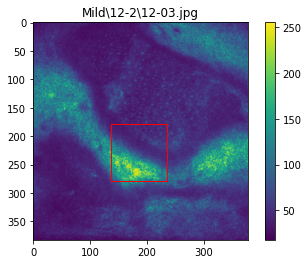

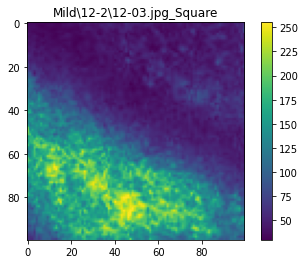

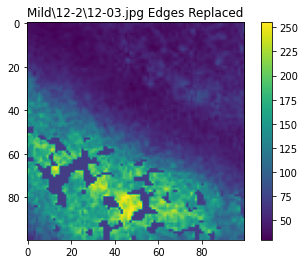

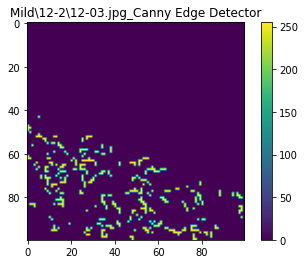

74-2-18.jpg
ifile =  Mild 74-2 74-2-18.jpg
	shape =  (390, 376)
max sharpness is  74-2-18.jpg 6.406843394872028 134 114


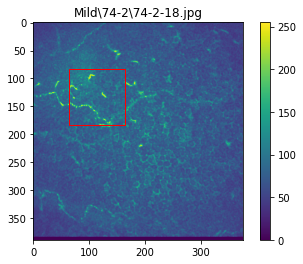

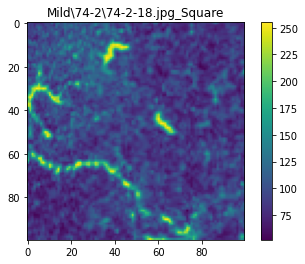

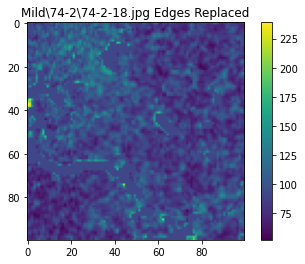

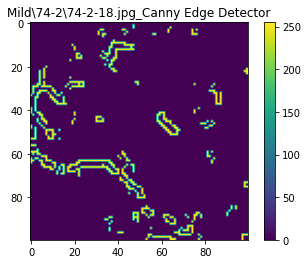

74-2-17.jpg
ifile =  Mild 74-2 74-2-17.jpg
	shape =  (387, 373)
max sharpness is  74-2-17.jpg 6.272085997354899 204 104


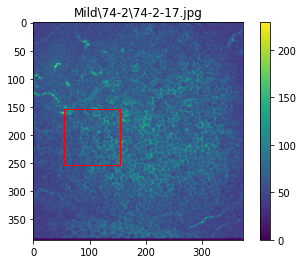

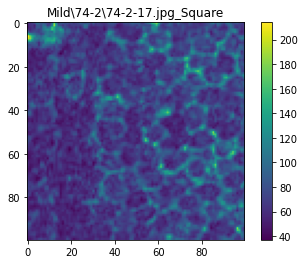

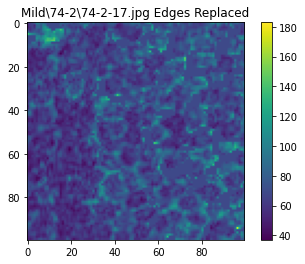

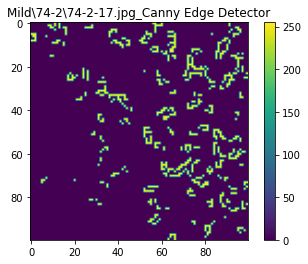

74-1-28.jpg
ifile =  Mild 74-1 74-1-28.jpg
	shape =  (382, 381)
max sharpness is  74-1-28.jpg 3.131257988684347 162 156


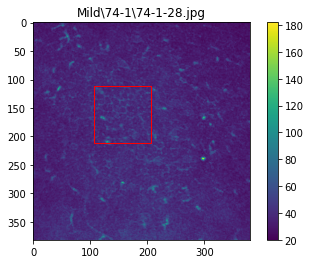

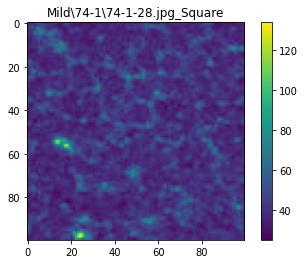

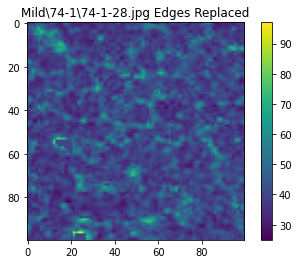

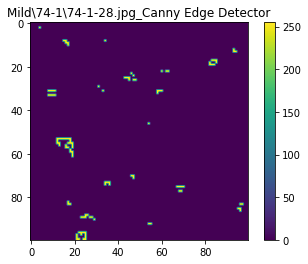

65-1-36.jpg
ifile =  Mild 65-1 65-1-36.jpg
	shape =  (387, 379)
max sharpness is  65-1-36.jpg 7.75866576669681 50 321


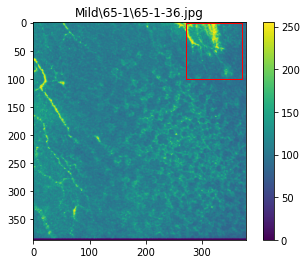

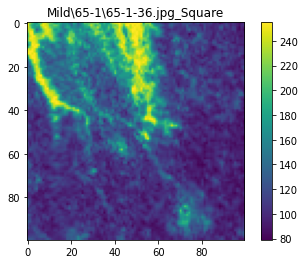

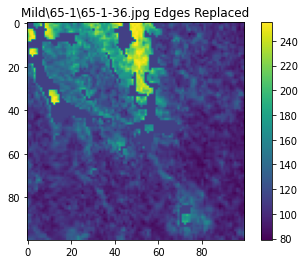

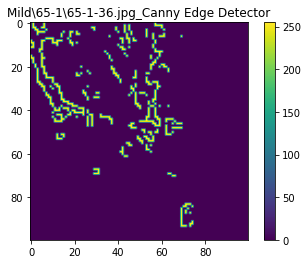

65-1-37.jpg
ifile =  Mild 65-1 65-1-37.jpg
	shape =  (383, 378)
max sharpness is  65-1-37.jpg 7.623936044829936 57 273


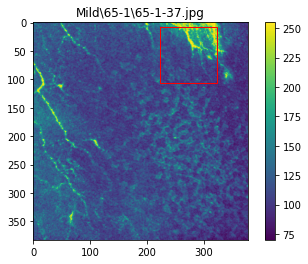

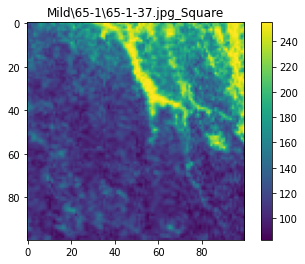

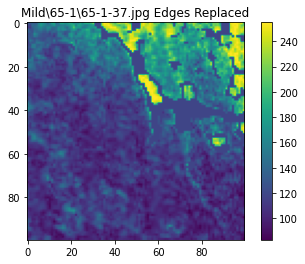

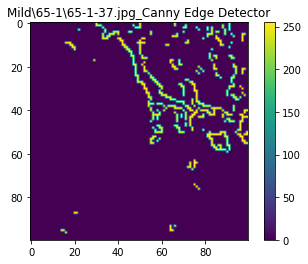

12-0-34.jpg
ifile =  Mild 12-0 12-0-34.jpg
	shape =  (395, 369)
max sharpness is  12-0-34.jpg 4.857059107973027 113 80


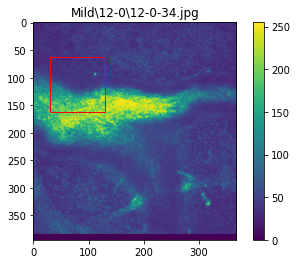

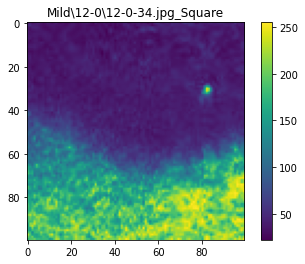

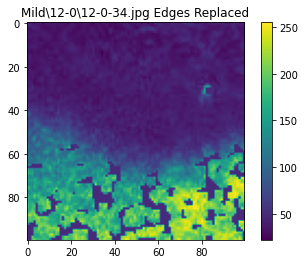

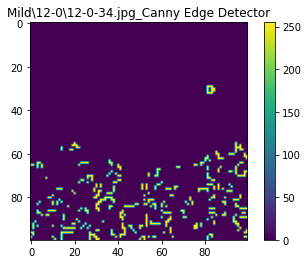

12-1-24.jpg
ifile =  Mild 12-1 12-1-24.jpg
	shape =  (389, 378)
max sharpness is  12-1-24.jpg 3.0217048783639457 225 143


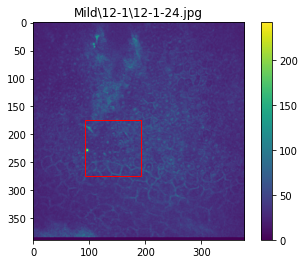

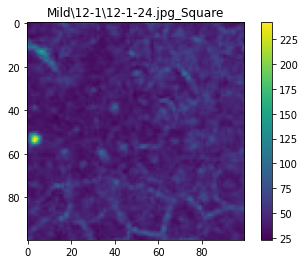

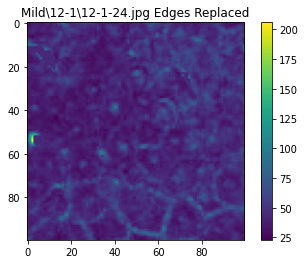

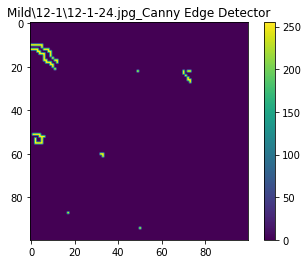

50-53-33.jpg
ifile =  Mild 50-53 50-53-33.jpg
	shape =  (380, 373)
max sharpness is  50-53-33.jpg 4.5724497637450225 178 154


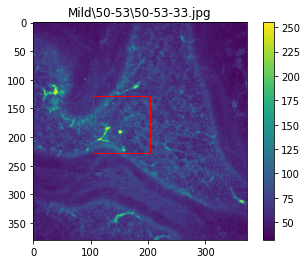

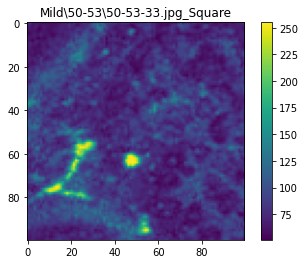

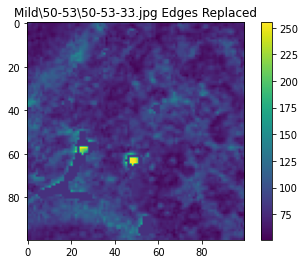

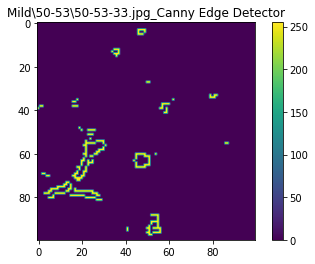

50-53-32.jpg
ifile =  Mild 50-53 50-53-32.jpg
	shape =  (382, 377)
max sharpness is  50-53-32.jpg 4.256459726668577 181 97


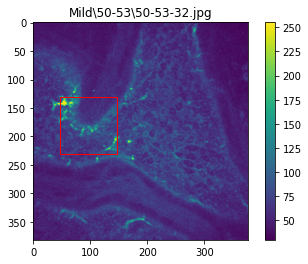

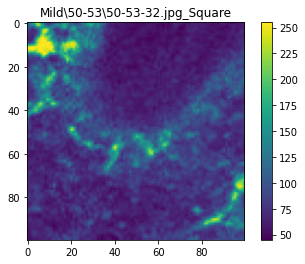

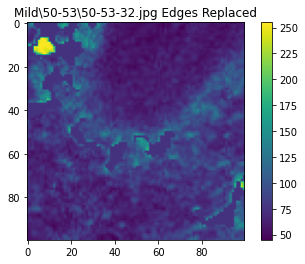

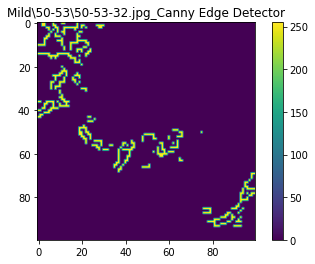

65-2-15.jpg
ifile =  Mild 65-2 65-2-15.jpg
	shape =  (388, 378)
max sharpness is  65-2-15.jpg 7.025924206499047 117 187


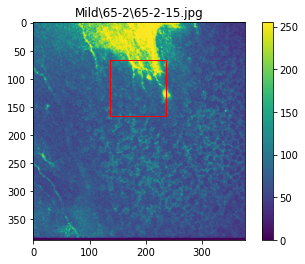

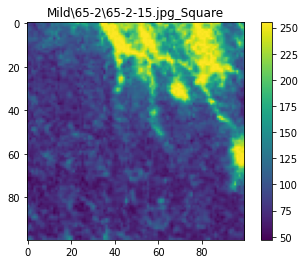

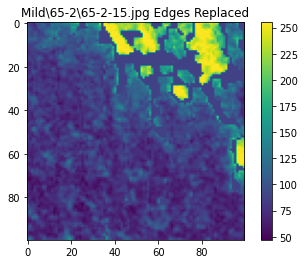

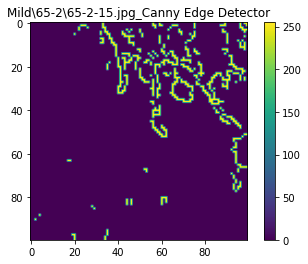

50-54-25.jpg
ifile =  Mild 50-54 50-54-25.jpg
	shape =  (387, 378)
max sharpness is  50-54-25.jpg 5.824620627007759 228 129


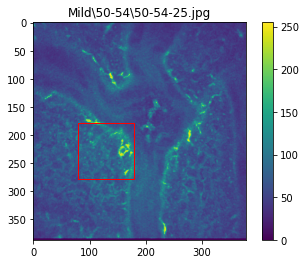

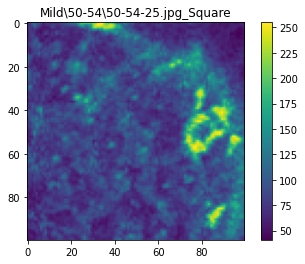

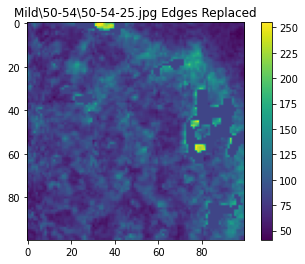

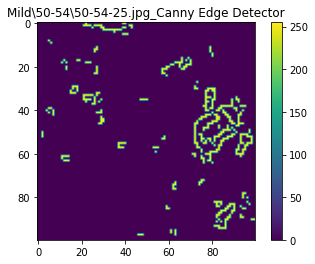

14-6-18.jpg
ifile =  Severe 14-6 14-6-18.jpg
	shape =  (389, 378)
max sharpness is  14-6-18.jpg 1.3585890687747348 159 167


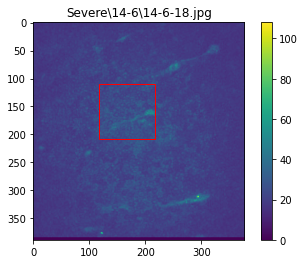

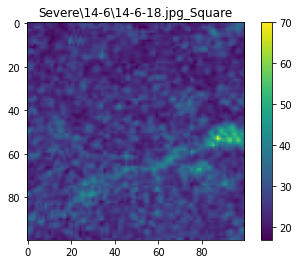

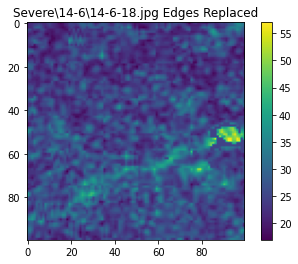

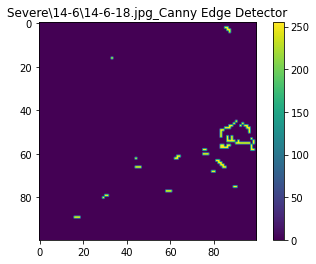

14-6-23.jpg
ifile =  Severe 14-6 14-6-23.jpg
	shape =  (390, 377)
max sharpness is  14-6-23.jpg 1.9030676713278571 170 183


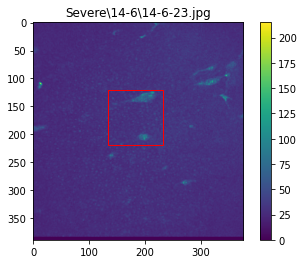

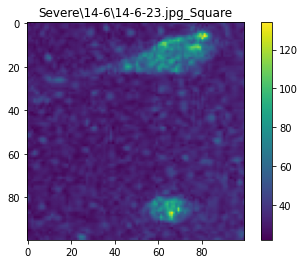

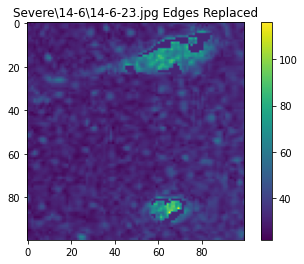

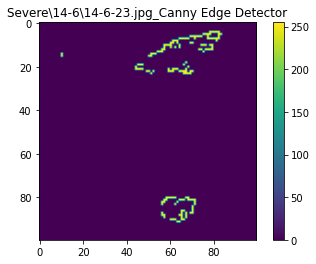

87-38-35.jpg
ifile =  Severe 87-38 87-38-35.jpg
	shape =  (384, 384)
max sharpness is  87-38-35.jpg 6.762859036144774 202 68


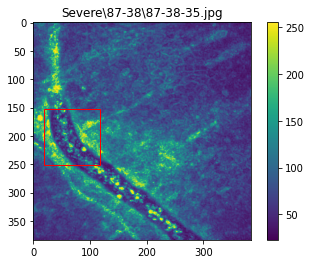

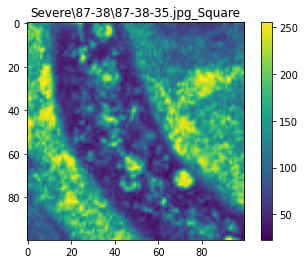

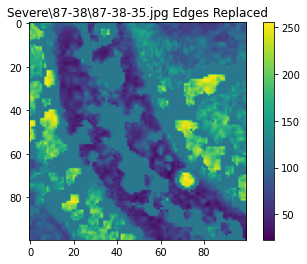

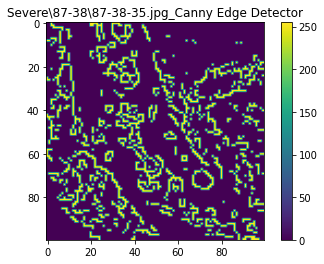

39-12-28.jpg
ifile =  Severe 39-12 39-12-28.jpg
	shape =  (385, 376)
max sharpness is  39-12-28.jpg 1.8669488143161932 169 232


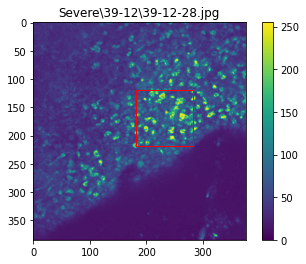

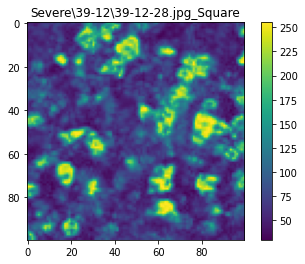

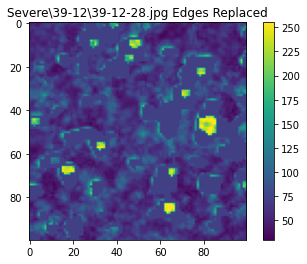

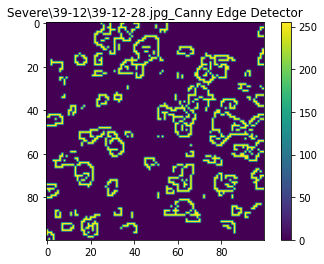

14-5-20.jpg
ifile =  Severe 14-5 14-5-20.jpg
	shape =  (388, 379)
max sharpness is  14-5-20.jpg 3.5165811722923763 183 102


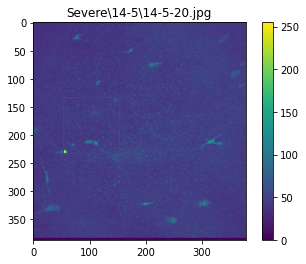

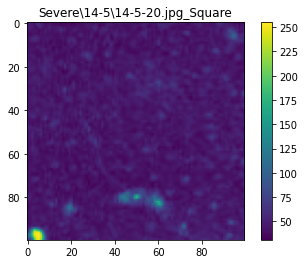

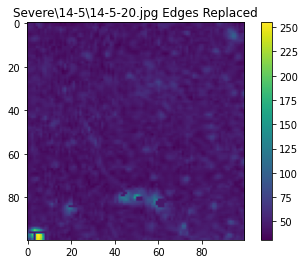

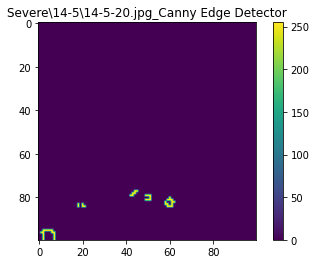

87-2-22.jpg
ifile =  Severe 87-2 87-2-22.jpg
	shape =  (383, 378)
max sharpness is  87-2-22.jpg 6.691178228034659 251 158


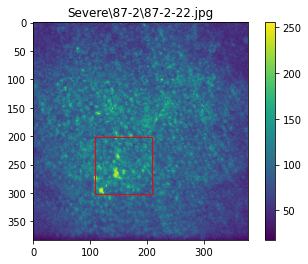

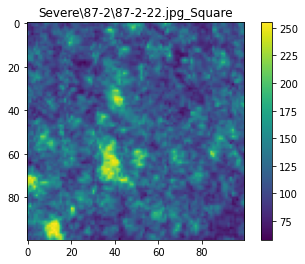

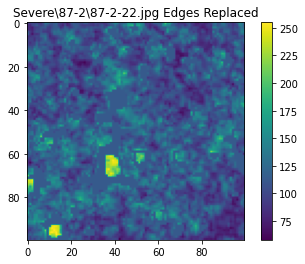

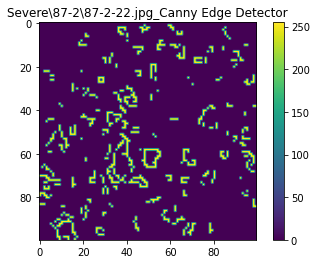

39-13-22.jpg
ifile =  Severe 39-13 39-13-22.jpg
	shape =  (384, 384)
max sharpness is  39-13-22.jpg 4.895677732115694 113 246


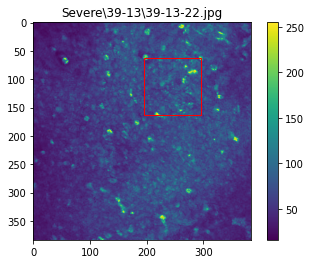

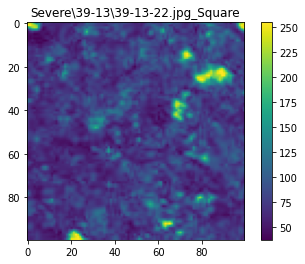

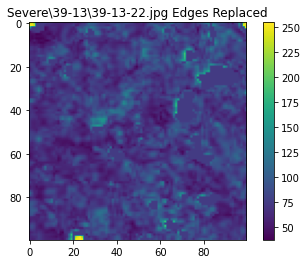

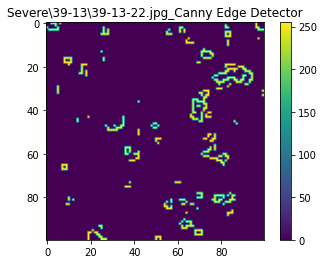

39-13-24.jpg
ifile =  Severe 39-13 39-13-24.jpg
	shape =  (384, 384)
max sharpness is  39-13-24.jpg 6.1907008843476286 284 259


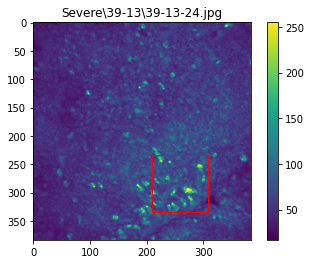

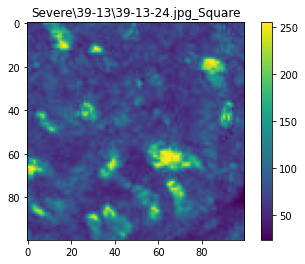

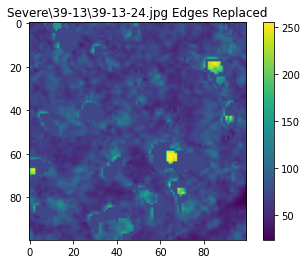

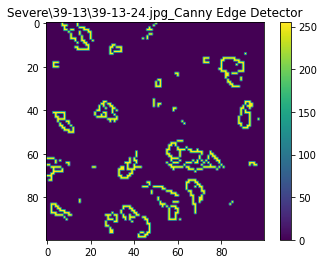

87-3-64.jpg
ifile =  Severe 87-3 87-3-64.jpg
	shape =  (389, 378)
max sharpness is  87-3-64.jpg 5.72274547591154 256 134


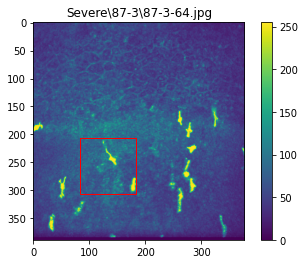

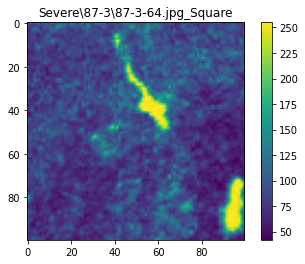

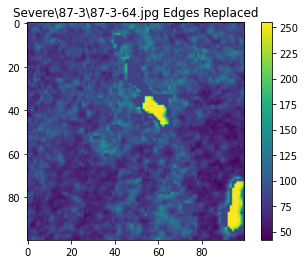

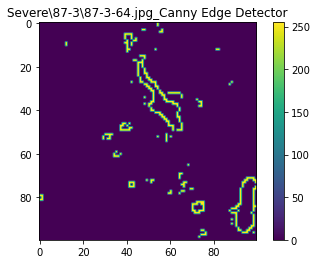

87-37.jpg
ifile =  Severe 87-37 87-37.jpg
	shape =  (387, 379)
max sharpness is  87-37.jpg 7.87527174828946 273 198


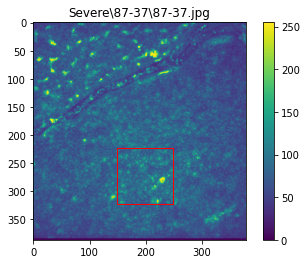

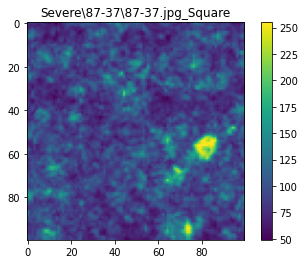

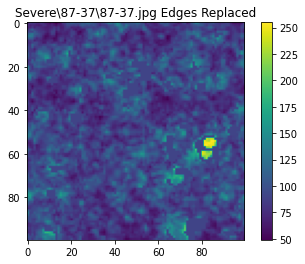

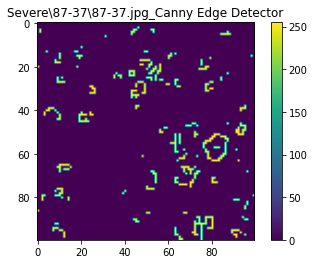

50-9-18.jpg
ifile =  Moderate 50-9 50-9-18.jpg
	shape =  (377, 376)
max sharpness is  50-9-18.jpg 6.585879356709363 194 185


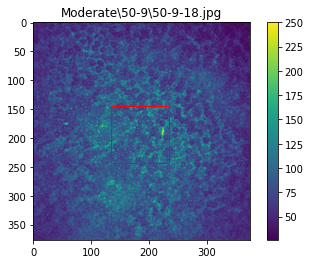

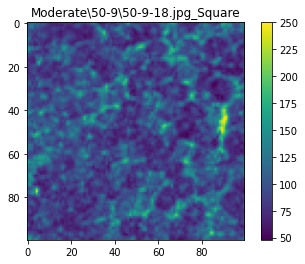

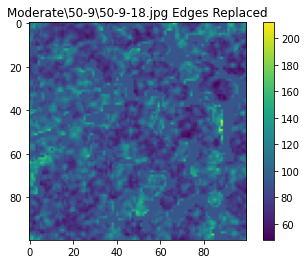

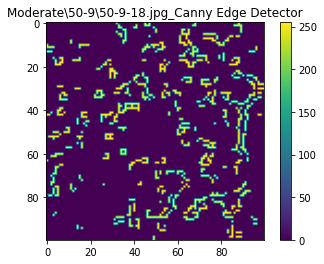

50--9-21.jpg
ifile =  Moderate 50-9 50--9-21.jpg
	shape =  (384, 379)
max sharpness is  50--9-21.jpg 10.27673837606281 333 111


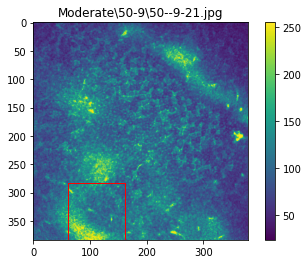

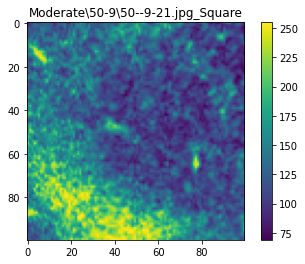

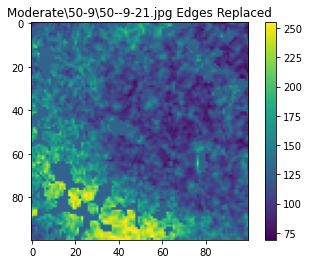

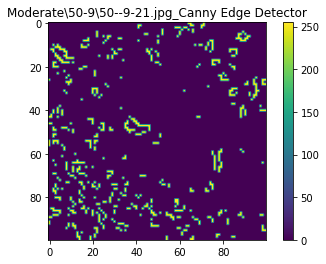

50-9-19.jpg
ifile =  Moderate 50-9 50-9-19.jpg
	shape =  (383, 378)
max sharpness is  50-9-19.jpg 7.583241636627374 273 174


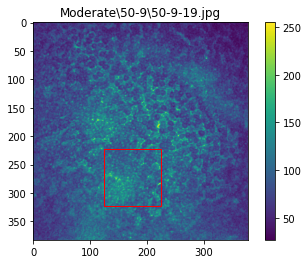

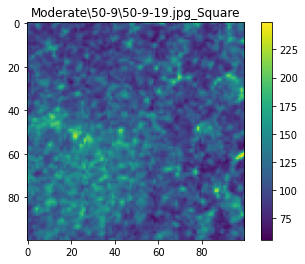

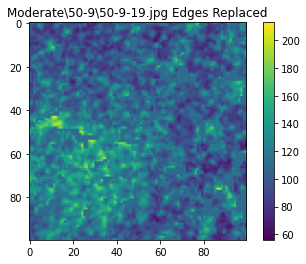

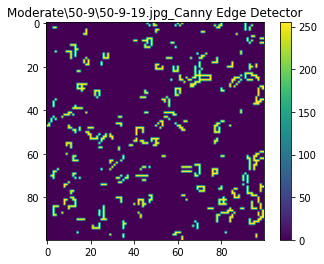

76-7-26.jpg
ifile =  Moderate 76-7 76-7-26.jpg
	shape =  (385, 376)
max sharpness is  76-7-26.jpg 5.021754774438502 261 248


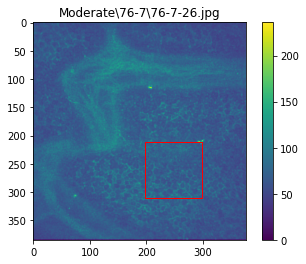

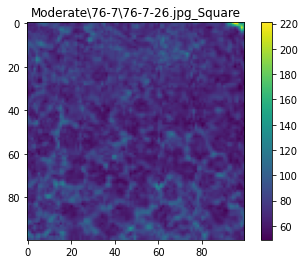

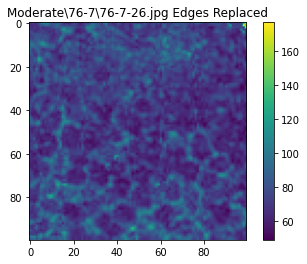

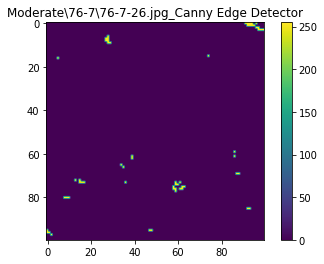

76-7-32.jpg
ifile =  Moderate 76-7 76-7-32.jpg
	shape =  (390, 376)
max sharpness is  76-7-32.jpg 7.265715188877398 191 233


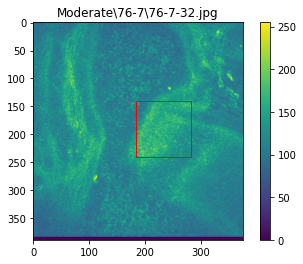

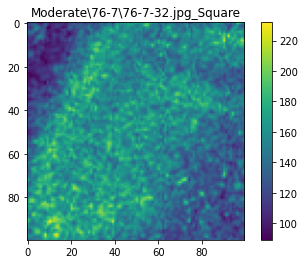

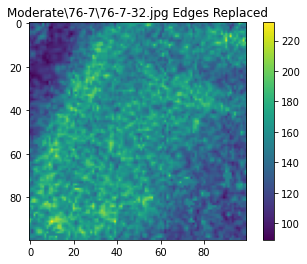

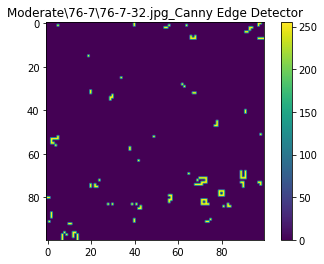

4-1-23.jpg
ifile =  Moderate 4-1 4-1-23.jpg
	shape =  (383, 377)
max sharpness is  4-1-23.jpg 5.631677614006439 192 258


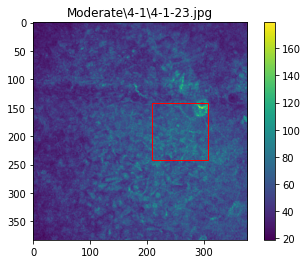

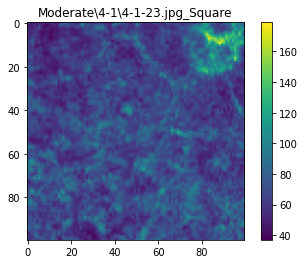

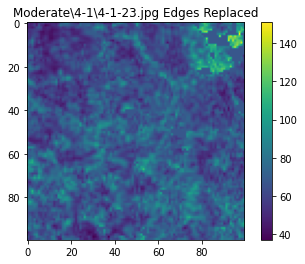

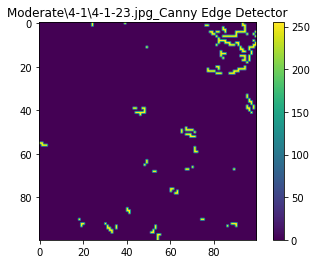

4-1-24.jpg
ifile =  Moderate 4-1 4-1-24.jpg
	shape =  (388, 379)
max sharpness is  4-1-24.jpg 6.453518725759944 207 265


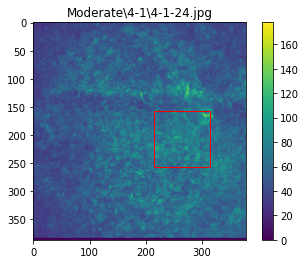

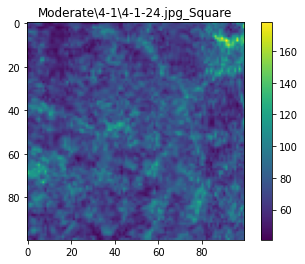

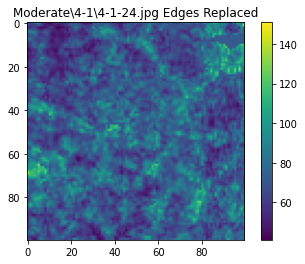

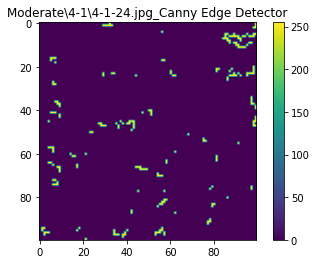

4-1-22.jpg
ifile =  Moderate 4-1 4-1-22.jpg
	shape =  (387, 379)
max sharpness is  4-1-22.jpg 4.385711555491205 233 250


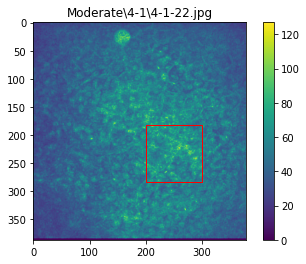

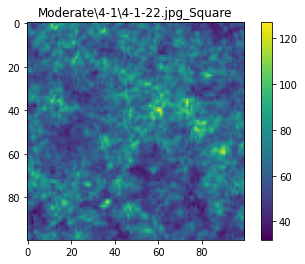

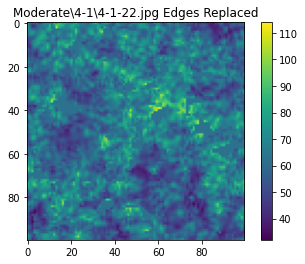

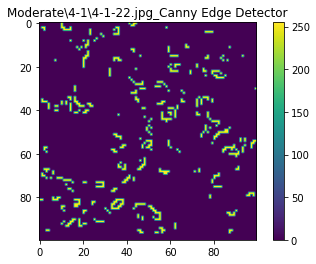

4-18-19.jpg
ifile =  Moderate 4-18 4-18-19.jpg
	shape =  (383, 376)
max sharpness is  4-18-19.jpg 4.797239775087511 214 242


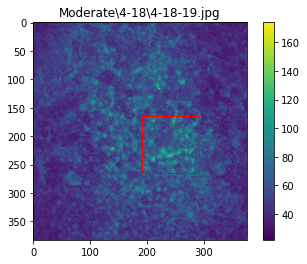

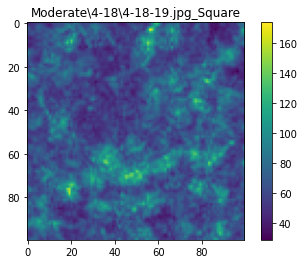

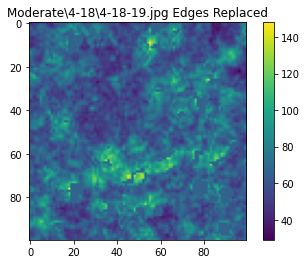

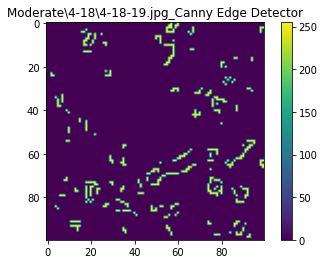

4-18-21.jpg
ifile =  Moderate 4-18 4-18-21.jpg
	shape =  (387, 378)
max sharpness is  4-18-21.jpg 6.380880535702708 200 249


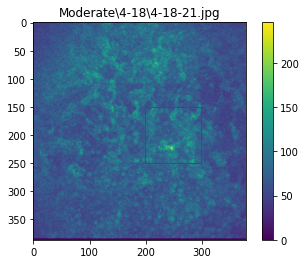

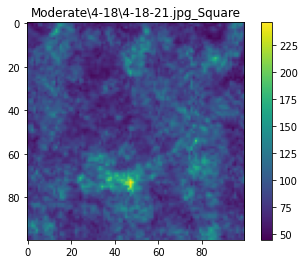

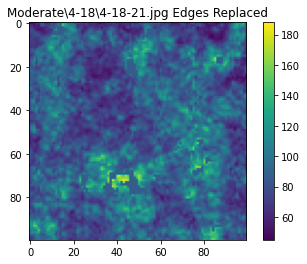

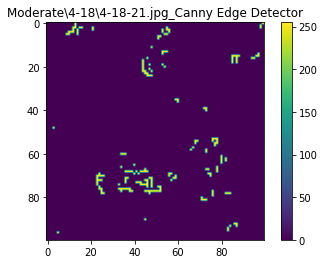

4-18-22.jpg
ifile =  Moderate 4-18 4-18-22.jpg
	shape =  (391, 377)
max sharpness is  4-18-22.jpg 7.97770813987284 69 197


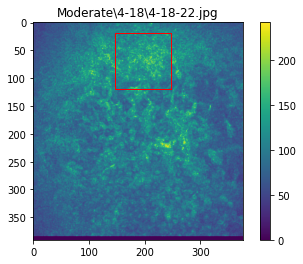

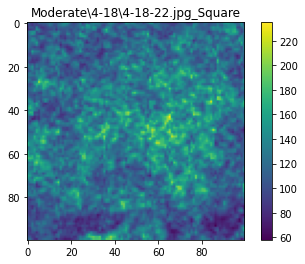

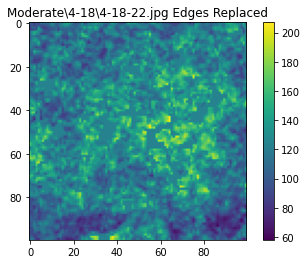

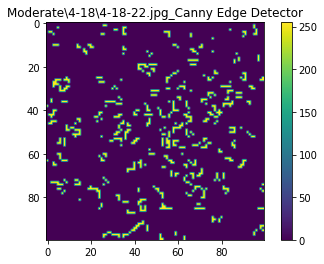

76-8-27.jpg
ifile =  Moderate 76-8 76-8-27.jpg
	shape =  (383, 379)
max sharpness is  76-8-27.jpg 7.2452362396697065 117 275


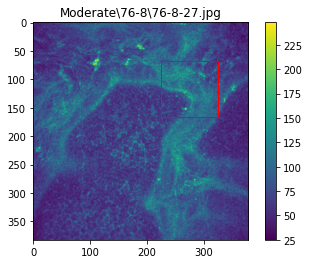

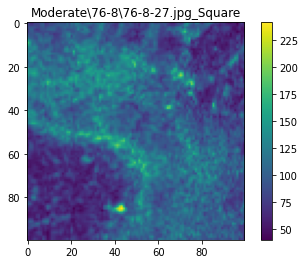

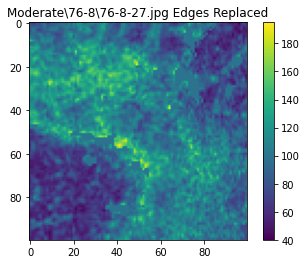

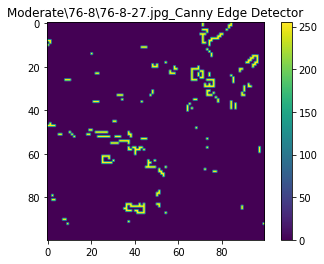

N2-na-od-6-21.jpg
ifile =  Control N2-6 N2-na-od-6-21.jpg
	shape =  (385, 379)
max sharpness is  N2-na-od-6-21.jpg 3.005340263026112 234 219


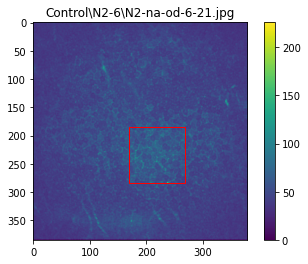

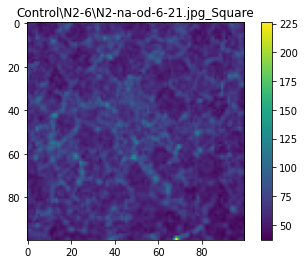

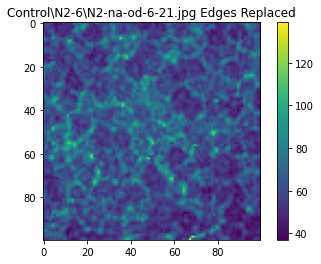

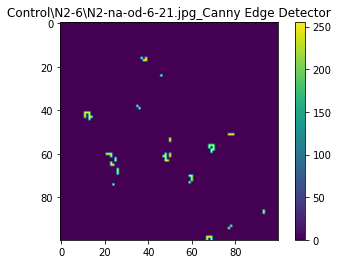

N2-na-od-0-25.jpg
ifile =  Control N2-0 N2-na-od-0-25.jpg
	shape =  (393, 372)
max sharpness is  N2-na-od-0-25.jpg 1.8109852988141537 233 212


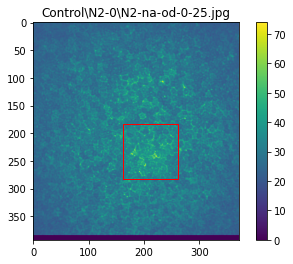

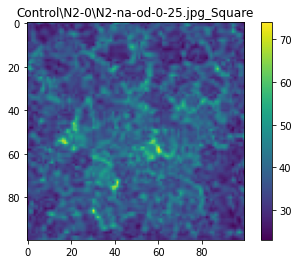

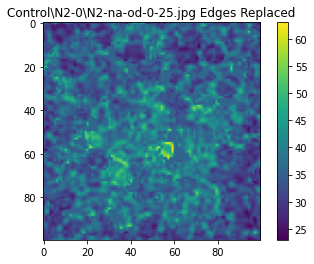

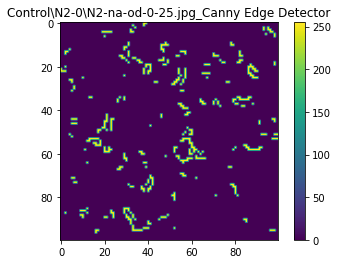

N2-na-od-0-26.jpg
ifile =  Control N2-0 N2-na-od-0-26.jpg
	shape =  (389, 379)
max sharpness is  N2-na-od-0-26.jpg 2.1473841643904557 228 188


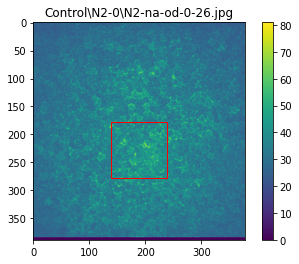

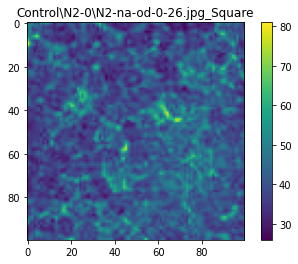

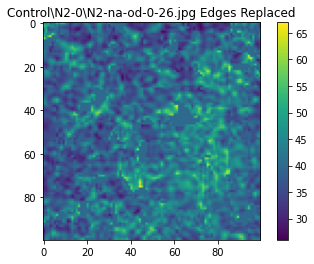

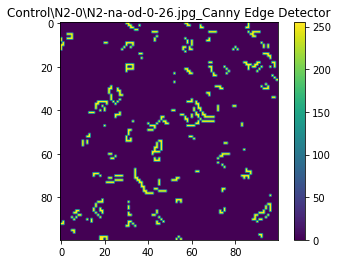

N1-1.jpg
ifile =  Control N1-1 N1-1.jpg
	shape =  (578, 576)
max sharpness is  N1-1.jpg 2.222504186466241 310 50


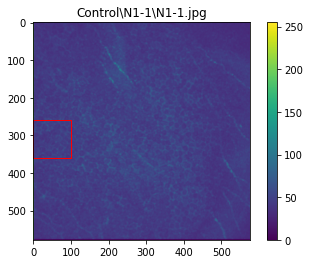

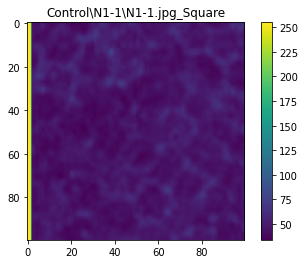

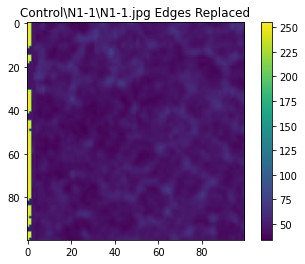

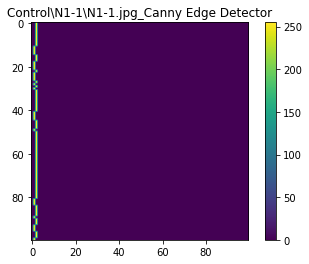

N3-2-32.jpg
ifile =  Control N3-2 N3-2-32.jpg
	shape =  (386, 379)
max sharpness is  N3-2-32.jpg 4.261446196097241 213 87


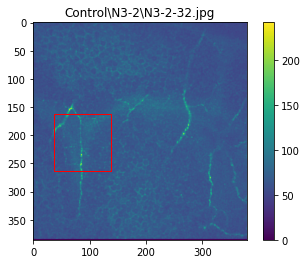

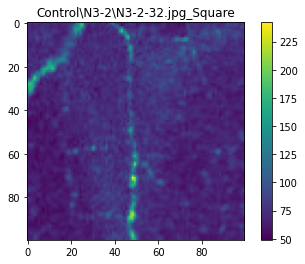

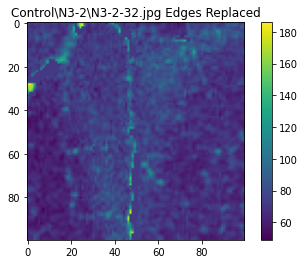

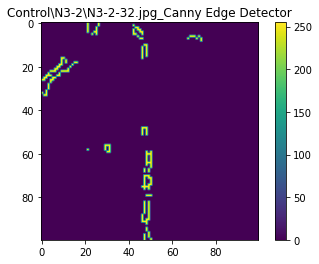

N3-1-30.jpg
ifile =  Control N3-1 N3-1-30.jpg
	shape =  (386, 379)
max sharpness is  N3-1-30.jpg 4.666756003259067 248 212


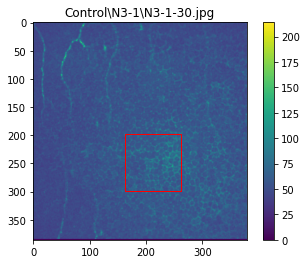

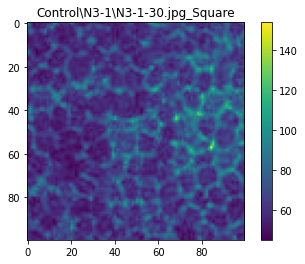

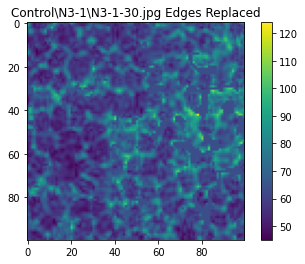

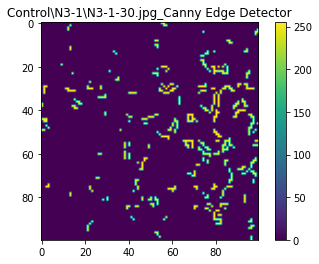

N3-1-31.jpg
ifile =  Control N3-1 N3-1-31.jpg
	shape =  (385, 379)
max sharpness is  N3-1-31.jpg 4.909535942679723 238 273


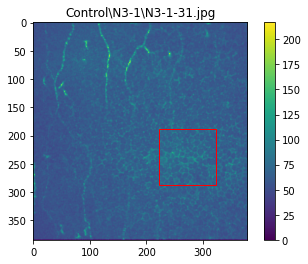

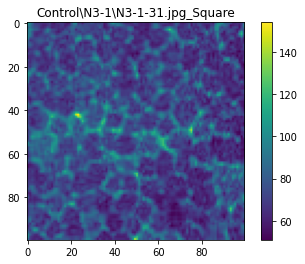

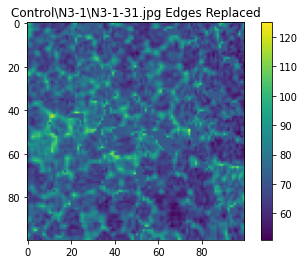

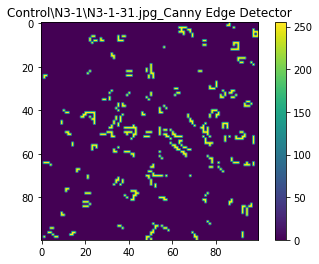

N1-2-30.jpg
ifile =  Control N1-2 N1-2-30.jpg
	shape =  (580, 572)
max sharpness is  N1-2-30.jpg 1.7760220618944427 379 370


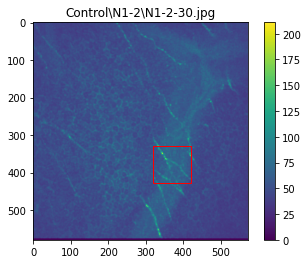

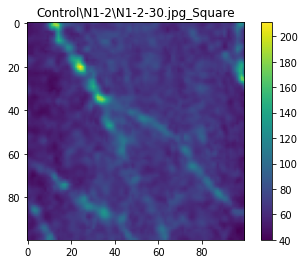

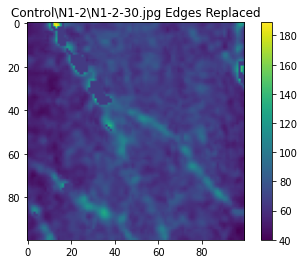

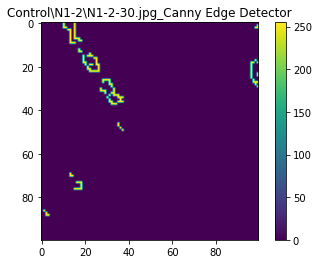

N1-2-31.jpg
ifile =  Control N1-2 N1-2-31.jpg
	shape =  (578, 574)
max sharpness is  N1-2-31.jpg 2.08021513951861 393 341


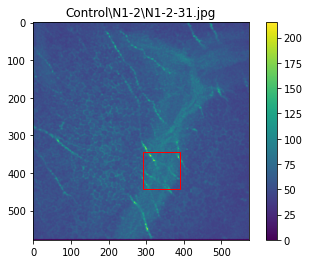

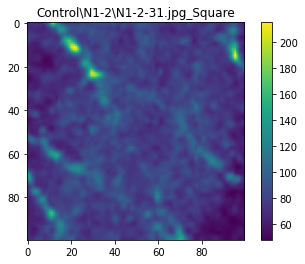

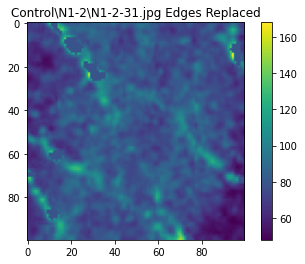

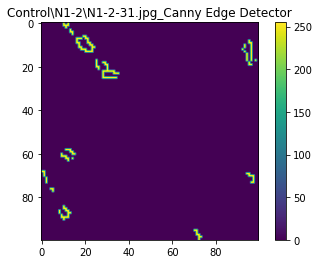

N1-47-23.jpg
ifile =  Control N1-47 N1-47-23.jpg
	shape =  (384, 384)
max sharpness is  N1-47-23.jpg 4.5205571808506955 283 201


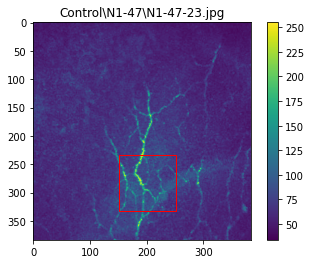

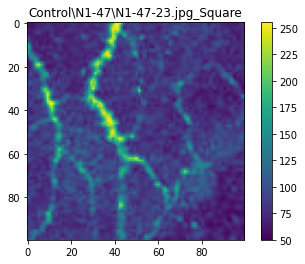

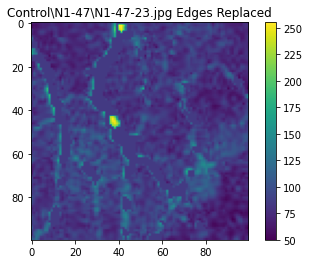

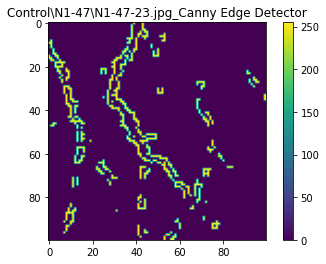

N1-46-16.jpg
ifile =  Control N1-46 N1-46-16.jpg
	shape =  (384, 379)
max sharpness is  N1-46-16.jpg 6.675390170796594 263 93


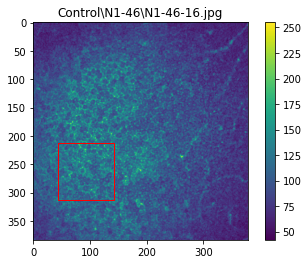

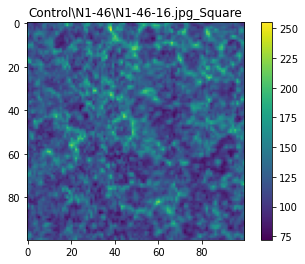

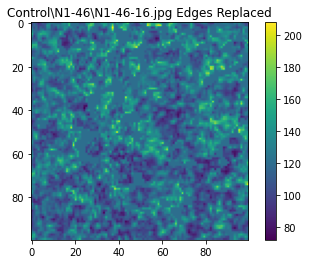

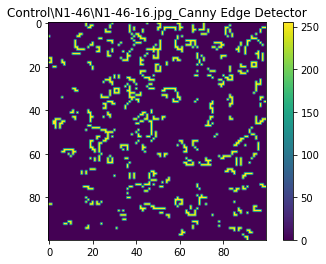

N1-46-17.jpg
ifile =  Control N1-46 N1-46-17.jpg
	shape =  (387, 379)
max sharpness is  N1-46-17.jpg 6.912605323099768 280 119


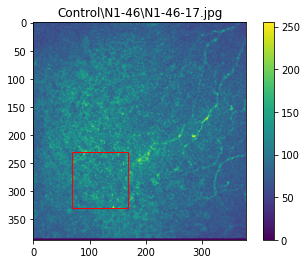

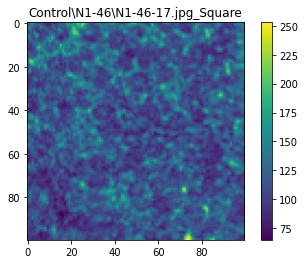

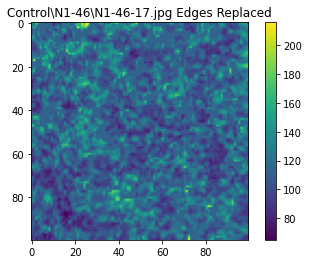

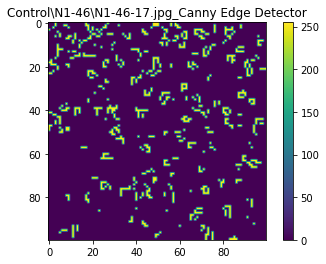

!!!!!! PATCH SELECTION COMPLETE


In [43]:
'''
Get patches
'''

#
# store outputs
#
output_patch = {}
output_borders ={}

#
# Go through every folder of data and pull out raw image data
#   find nxn square that gives best sharpness value from gradients
#
for ikey in im.keys():
    for ptype in im[ikey].keys():
        for ptfolder in im[ikey][ptype].keys():
            for ifile in im[ikey][ptype][ptfolder].keys():
                print(ifile)
                imdata = im[ikey][ptype][ptfolder][ifile]
                print('ifile = ',ikey,ptfolder,ifile)
                if (np.size(imdata)> 0):
                    image_shape = np.shape(imdata)
                    print('\tshape = ',image_shape)
                    irow = image_shape[0]
                    icol = image_shape[1]


                    box_length = 50 #length from center to one side
                    max_sharpness = 0.0 #default output value
                    max_row = 0 #default location of maximum sharpness
                    max_col = 0 #default location of maximum sharpness
                    for row in range(box_length, irow- box_length):
                        for col in range(box_length, icol - box_length):
                            square_data =get_square(imdata,row,col,box_length)
                            
                            ####################################################
                            # check to see if vessel hijacking values
                            ####################################################

                            #get max intensity and lowest intensity over image
                            max_i = np.max(square_data) #imdata)
                            min_i = np.min(square_data) #imdata)

                            #get indices to any areas in box that exceed an 
                            #intesity threshold. This will be used to boot out 
                            #any squares that have a lot of very high intensity
                            #pixels, which can be caused by other tissue in the 
                            #view
                            high_intensity = np.argwhere(square_data >= (max_i * 0.80))
                            numels = np.size(square_data)
                            
                            if (np.size(high_intensity) >= (numels*0.2)):
                                #lots of high intensity pixels found in this
                                #print('max, min,numels is ',max_i,min_i,numels,np.size(high_intensity))
                                #print('too many High I pixels. Drop this one')
                                continue
                            
                            #
                            #Detect thin high intensity areas in subsample
                            #
                            sq2 = square_data.copy() #temp holder

                            #get median and max values in square. Find any edges
                            #that are within an upper range of this intensity
                            med = np.median(sq2)
                            max2 = np.max(sq2)
                            edges = cv2.Canny(np.uint8(sq2),max2*0.85,max2)
                            #note: edges are output in binary

                            '''
                            edge_index = np.argwhere(edges > 0)
                            output_image = sq2.copy()
                            if (np.size(edge_index) > 0):
                                
                                for edge_vals in edge_index:
                                    output_image[edge_vals[0],edge_vals[1]] =  med
                            else:
                                print('!!! No edges found')
                            '''



                            '''
                            gy,gx = np.gradient(output_image)#edges avgd out
                            #gy,gx = np.gradient(square_data)

                            gnorm = np.sqrt(gx**2 + gy**2)
                            sharpness_number = np.average(gnorm)
                            '''

                            #
                            # Flood fill the edges to remove them. Fill in with 
                            # average values
                            #
                            #flood_image = edges.copy()
                            #replace_value = med

                            #try to fill in gaps of thin lines
                            kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (4, 4))
                            dilated = cv2.dilate(edges, kernel)
                            eroded=cv2.erode(dilated,kernel)
                            output_image = square_data.copy()
                            #temp_sq2 = output_image.copy()
                            index = np.argwhere(eroded > 0) #binary for edges
                            for ivals in index:
                                #replace all edge values with medium
                                if (np.size(ivals) > 0):
                                    output_image[ivals[0],ivals[1]] = med
                                    #temp_sq2[ivals[0],ivals[1]] = med
                                else:
                                    print('No binary eroded edges')



                            #
                            #Calculate sharpness
                            #
                            gy,gx = np.gradient(output_image)#edges avgd out
                            #gy,gx = np.gradient(square_data)

                            gnorm = np.sqrt(gx**2 + gy**2)
                            sharpness_number = np.average(gnorm)


                            '''
                            for edge_vals in edge_index:
                                edge_pixel = (edge_vals[1],edge_vals[0]) #order is col,row for floodfill
                                cv2.floodFill(flood_image, None, seedPoint=edge_pixel, newVal=replace_value, loDiff=10, upDiff=30)
                            #get all flooded values and overlay them onto the 
                            #square matrix
                            flood_index = np.argwhere(flood_image == med)
                            temp_sq2 = square_data.copy()
                            for flooded_point in flood_index:
                                temp_sq2[flooded_point[0],flooded_point[1]] = med
                            '''                            
                            #
                            #If this sharpness value is greater than the prev.
                            #stored value, replace the max value. This will
                            #always contain the square with the best sharpness
                            #
                            if (sharpness_number > max_sharpness):
                                max_sharpness = sharpness_number
                                max_row = row
                                max_col = col
                                square_holder = square_data.copy()
                                edge_holder = edges.copy()
                                output_image_holder = output_image.copy()
                                #flood_image_holder = flood_image.copy()

                                #debug save
                                #temp_sq2_holder = temp_sq2.copy()

                                #filename of sharpest file
                                file_indicator = ikey + '\\' + ptfolder + '\\' + ifile
                    print('max sharpness is ',ifile, sharpness_number,max_row,max_col)
                else:
                    print('found an empty file', ptfolder, ifile)
                
                #
                # Define box coordinates
                #
                left_wall = max_col - box_length
                right_wall = max_col + box_length
                low_wall = max_row - box_length
                high_wall = max_row + box_length


                #plot original image data
                plt.figure()
                plt.imshow(imdata)
                plt.title(file_indicator)
                plt.colorbar()

                #define square for plotting over the image
                rect = patches.Rectangle((left_wall,low_wall),box_length*2,box_length*2,linewidth=1,edgecolor='r',facecolor='none')

                # Get the current reference
                ax = plt.gca()
                # Add the patch to the Axes
                ax.add_patch(rect)
                plt.show()

                
                #
                #histogram
                #
                #hist, bin_edges= np.histogram(imdata)
                
                #plot square contents
                plt.figure()
                plt.imshow(square_holder)
                plt.colorbar()
                tname = file_indicator + '_Square'
                plt.title(tname)
                plt.show()

                #plot the square with edges replaced with mean values
                plt.figure()
                plt.imshow(output_image_holder)
                plt.colorbar()
                tname = file_indicator + ' Edges Replaced'
                plt.title(tname)
                plt.show()
                
                #plot edges found
                plt.figure()
                plt.imshow(edge_holder)
                plt.colorbar()
                tname = file_indicator + '_Canny Edge Detector'
                plt.title(tname)
                plt.show()



                '''
                #plot the square with edges replaced with mean values
                plt.figure()
                plt.imshow(flood_image_holder)
                plt.colorbar()
                tname = file_indicator + ' Flooded Edges'
                plt.title(tname)
                plt.show()
                '''
                #plot the square with edges replaced with mean values
                #plt.figure()
                #plt.imshow(temp_sq2_holder)
                #plt.colorbar()
                #tname = file_indicator + ' Flood replacement Full'
                #plt.title(tname)
                #plt.show()


                #
                # Save the best square data to a dictionary for later writing
                #
                output_patch[ifile] = output_image_holder
                output_borders[ifile] = [left_wall, right_wall, low_wall, high_wall]


print('!!!!!! PATCH SELECTION COMPLETE')



#
# Save final outputs to pickle files
#

with open(output_patch_pickle, 'wb') as handle:
    pickle.dump(output_patch, handle, protocol=pickle.HIGHEST_PROTOCOL)

with open(output_border_pickle, 'wb') as handle:
    pickle.dump(output_borders, handle, protocol=pickle.HIGHEST_PROTOCOL)

print('Saved data to pickle files')

(395, 369, 3)


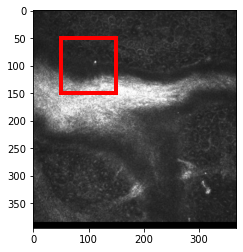

single pixel =  [248 248 248]


Text(0.5, 1.0, 'Filled 2')

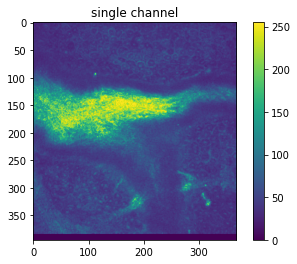

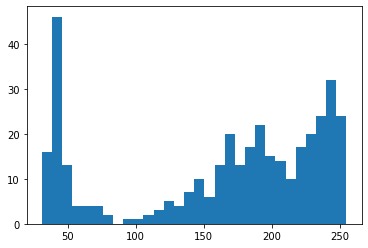

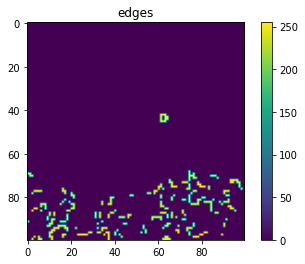

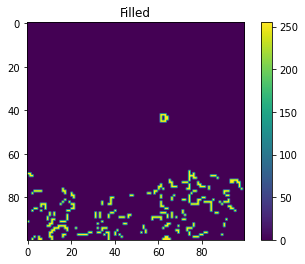

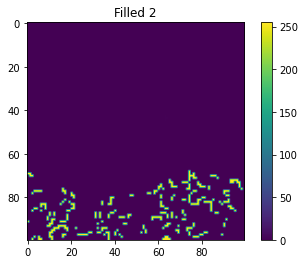

In [26]:
a = im['Severe']['Anonymized']['87-38']['87-38-35.jpg']
#f = '/content/gdrive/My Drive/BE224B_2020/Central BCD4/Severe/Anonymized/87-38/87-38-35.jpg'



f='/content/gdrive/My Drive/BE224B_2020/Central BCD4/Mild/Anonymized/12-0/12-0-34.jpg'



rgb =  imageio.imread(f)
gray_image = rgb #np.dot(rgb[...,:3], [0.299, 0.587, 0.114])

print(np.shape(rgb))


plt.figure()
plt.imshow(gray_image)
rect = patches.Rectangle((50,50),100,100,linewidth=4,edgecolor='r',facecolor='none')

# Get the current reference
ax = plt.gca()


# Add the patch to the Axes
ax.add_patch(rect)

plt.show()

plt.figure()
plt.imshow(rgb[:,:,2])
plt.colorbar()
plt.title('single channel')

print('single pixel = ', rgb[150,180,:])


plt.figure()
plt.hist(rgb[150,:,0],bins= 30)


sq2 = rgb[50:150,50:150]
med = np.median(sq2)
max2 = np.max(sq2)
edges = cv2.Canny(np.uint8(sq2),max2*0.85,max2)

plt.figure()
plt.imshow(edges)
plt.colorbar()
plt.title('edges')




matrix_np = np.asarray(edges)
numeric_matrix = np.where(matrix_np>0,1,0)
mask = np.zeros(np.asarray(numeric_matrix.shape)+2, dtype=np.uint8)
start_pt = (43,63) #y,x)
if matrix_np[start_pt]:
  cv2.floodFill(numeric_matrix, mask, start_pt, 255, flags=4)
mask = mask[1:-1, 1:-1]
matrix_np[mask==1] = 1 #"c"
matrix = matrix_np.tolist()


edges_temp = edges.copy()
cv2.floodFill(edges_temp, None, seedPoint=(63,43), newVal=1, loDiff=(5, 5, 5, 5), upDiff=(5, 5, 5, 5))

plt.figure()
plt.imshow(matrix_np)
plt.colorbar()
plt.title('Filled')

plt.figure()
plt.imshow(edges_temp)
plt.colorbar()
plt.title('Filled 2')


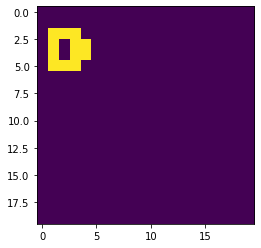

In [20]:
plt.figure()
plt.imshow(edges[40:60,60:80])  #43,63

In [0]:
a = im['Control']['Anonymized']['N3-2']['N3-2-32.jpg']
plt.figure()
plt.imshow(a)

'''
red = a[:,:,0]
green = a[:,:,1]
blue = a[:,:,2]



gray = 0.2989 * red + 0.5870 * green + 0.1140 * blue
g2=np.dot(a[...,:3], [0.299, 0.587, 0.114])
'''


gy,gx = np.gradient(a)

gnorm = np.sqrt(gx**2 + gy**2)
sharpness_number = np.average(gnorm)

print('sharpness is ',sharpness_number)

plt.figure()
plt.imshow(gy)
plt.colorbar()


plt.figure()
plt.imshow(gx)
plt.colorbar()

'''
#im = Image.open(filename).convert('L') # to grayscale
array = np.asarray(im, dtype=np.int32)

gy, gx = np.gradient(array)
gnorm = np.sqrt(gx**2 + gy**2)
sharpness = np.average(gnorm)
'''


In [0]:
imdata[ [0 5]]